In [1]:
import torch
import sklearn
import random
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import math

from torch import nn
from torch import optim
from torch.nn import functional as F
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Conv2D, MaxPool2D, Dropout,Flatten, Conv1D, MaxPool1D, LSTM, TimeDistributed, RepeatVector
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn import metrics
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf
from sklearn.model_selection import train_test_split

import time
import os
import sys
import pandas as pd
import numpy as np
import scipy as sp
from scipy import signal
import math
import matplotlib.pyplot as plt
import json
import math


In [2]:
SEED = 13
tf.random.set_seed(SEED)

In [3]:
def encode_gait_percentage(df, name):
  percent = df[name].values.tolist()
  X = np.zeros((len(df[name]),1))
  Y = np.zeros((len(df[name]),1))
  for i in range (len(percent)): 
    phi = percent[i] * 2 * math.pi / 100
    X[i] = math.cos(phi)
    Y[i] = math.sin(phi)
  df['X'] = X
  df['Y'] = Y

In [4]:
def convert_data(d_x, d_y, look_back = 1, fore_cast = 1):
    dataX = []
    dataY = []

    for i in range(look_back, len(d_x) - fore_cast):
        dataX.append(d_x[i - look_back: i]) 
        dataY.append(d_y[i + fore_cast,:])
    
    return np.array(dataX), np.array(dataY)

In [5]:
working_dir = os.getcwd()#os.path.dirname(os.getcwd())
sys_platform = sys.platform
excel_path_dict = {'linux' : "/csvs/", 'win32' : "\Data\Incline\\right_based\\"}
excel_path_name = excel_path_dict[sys_platform]

directory_path = working_dir 
print(directory_path)
excel_path = directory_path + excel_path_name


c:\Users\Admin\Desktop\Neurorobotic Lab\Data_Code\Model\Gait_Phase_Prediction


In [6]:
# ---------------------------------------------------- #
#  -> Provide Number of Trainning Subj and Test Subj.  #
#  -> List all the file name per each subj.            #
# ---------------------------------------------------- #

no_subj_train = 4
no_subj_test  = 1

sub1_file = ['TH\TH_4_I_r.xlsx', 'TH\TH_2_I_r.xlsx', 'TH\TH_3_I_r.xlsx']
sub2_file = ['JJ\JJ_4_I_r.xlsx', 'JJ\JJ_6_I_r.xlsx', 'JJ\JJ_7_I_r.xlsx']
sub3_file = ['SD\SD_1_I_r.xls', 'SD\SD_4_I_r.xls', 'SD\SD_2_I_r.xls', 'SD\SD_3_I_r.xls', 'SD\SD_5_I_r.xls']
sub4_file = ['PK\PK_0_I_r.xls', 'PK\PK_5_I_r.xls', 'PK\PK_2_I_r.xls', 'PK\PK_3_I_r.xls']
sub5_file = ['SKS\SKS_0_I_r.xls', 'SKS\SKS_4_I_r.xls', 'SKS\SKS_2_I_r.xls', 'SKS\SKS_3_I_r.xls', 'SKS\SKS_5_I_r.xls']
sub6_file = ['SOE\SOE_I_0.xlsx', 'SOE\SOE_I_2.xlsx', 'SOE\SOE_I_3.xlsx', 'SOE\SOE_I_4.xlsx', 'SOE\SOE_I_5.xlsx']
sub7_file = ['VP\VP_I_0.xlsx', 'VP\VP_I_2.xlsx', 'VP\VP_I_3.xlsx', 'VP\VP_I_5.xlsx']


In [7]:
# ---------------------------------------------------- #
#  -> Concat all Subj into a list                      #
#  -> Randomly shuffle the subj list                   #
# ---------------------------------------------------- #

#list1 = [sub1_file, sub2_file, sub3_file, sub4_file, sub5_file]
list1 = [sub5_file, sub6_file, sub7_file, sub3_file, sub4_file]
print("Number of all subject: ", len(list1))



Number of all subject:  5


In [8]:
import random
random.shuffle(list1)

list1

[['SKS\\SKS_0_I_r.xls',
  'SKS\\SKS_4_I_r.xls',
  'SKS\\SKS_2_I_r.xls',
  'SKS\\SKS_3_I_r.xls',
  'SKS\\SKS_5_I_r.xls'],
 ['VP\\VP_I_0.xlsx', 'VP\\VP_I_2.xlsx', 'VP\\VP_I_3.xlsx', 'VP\\VP_I_5.xlsx'],
 ['PK\\PK_0_I_r.xls',
  'PK\\PK_5_I_r.xls',
  'PK\\PK_2_I_r.xls',
  'PK\\PK_3_I_r.xls'],
 ['SOE\\SOE_I_0.xlsx',
  'SOE\\SOE_I_2.xlsx',
  'SOE\\SOE_I_3.xlsx',
  'SOE\\SOE_I_4.xlsx',
  'SOE\\SOE_I_5.xlsx'],
 ['SD\\SD_1_I_r.xls',
  'SD\\SD_4_I_r.xls',
  'SD\\SD_2_I_r.xls',
  'SD\\SD_3_I_r.xls',
  'SD\\SD_5_I_r.xls']]

In [9]:
# ---------------------------------------------------- #
#  -> Randomly choose (n) number Subj for testing by   #
#      poping an element from the list                 #
# ---------------------------------------------------- #

test_sub = list1.pop()

print("Test Subj: ", test_sub)

Test Subj:  ['SD\\SD_1_I_r.xls', 'SD\\SD_4_I_r.xls', 'SD\\SD_2_I_r.xls', 'SD\\SD_3_I_r.xls', 'SD\\SD_5_I_r.xls']


In [10]:
file_list = []

for i in range (len(list1)):
    for j in range(len(list1[i])):
        file_list.append(pd.read_excel(excel_path + list1[i][j], sheet_name='Sheet1'))

In [11]:
random.shuffle(file_list)

all_data = pd.concat(file_list, axis = 0, ignore_index = True)

In [12]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 881177 entries, 0 to 881176
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   n_lcop        881177 non-null  float64
 1   n_rcop        881177 non-null  float64
 2   l_ph_ank      881177 non-null  float64
 3   l_ph_hip      881177 non-null  float64
 4   l_ph_fo       881177 non-null  float64
 5   r_ph_ank      881177 non-null  float64
 6   r_ph_hip      881177 non-null  float64
 7   r_ph_fo       881177 non-null  float64
 8   n_lgrf        881177 non-null  float64
 9   n_r_grf       881177 non-null  float64
 10  st_sw_phase   881177 non-null  int64  
 11  perc_new      881177 non-null  float64
 12  strike_frame  881177 non-null  int64  
dtypes: float64(11), int64(2)
memory usage: 87.4 MB


In [13]:
cycle = 0
cycle_list = []

start = 0

for i in range(len(all_data) - 1):
    if (all_data['perc_new'][i+1] == 0):
        cycle += 1
        cycle_list.append(all_data.iloc[start:i])
        start = i+1

random.shuffle(cycle_list)
source_table = pd.concat(cycle_list, axis=0, ignore_index=True)

source_table
        

,n_lcop,n_rcop,l_ph_ank,l_ph_hip,l_ph_fo,r_ph_ank,r_ph_hip,r_ph_fo,n_lgrf,n_r_grf,st_sw_phase,perc_new,strike_frame
0,0.093936,0.000835,0.390759,0.554032,0.492516,8.451398e-01,0.827489,0.961558,0.874743,0.051646,0,0.000000,1
1,0.093823,0.001036,0.380857,0.547417,0.492194,8.314151e-01,0.830120,0.949867,0.865289,0.071070,0,0.450450,2
2,0.093580,0.001258,0.371637,0.540117,0.491899,8.208333e-01,0.833510,0.938159,0.854137,0.092997,0,0.900901,3
3,0.093208,0.001501,0.363136,0.532107,0.491629,8.124780e-01,0.837653,0.926826,0.841103,0.116947,0,1.351351,4
4,0.092715,0.001762,0.355360,0.523379,0.491383,8.057364e-01,0.842515,0.916184,0.826051,0.142529,0,1.801802,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
877102,0.000000,0.000000,0.000000,340.597914,358.516837,2.445677e-08,44.498126,328.360124,0.000000,2.776869,0,97.757848,219
877103,0.000000,0.000000,0.000000,339.304137,358.951878,2.094635e-08,14.986631,328.511229,0.000000,2.777210,0,98.206278,220
877104,0.000000,0.000000,0.000000,338.039003,359.430446,1.612295e-08,334.831510,328.792346,0.000000,2.776026,0,98.654709,221
877105,0.000000,0.000000,0.000000,336.796265,359.948104,9.813675e-09,308.866184,329.232931,0.000000,2.773203,0,99.103139,222


In [14]:
drop_list = ["n_lgrf","n_r_grf","l_ph_ank","r_ph_ank"]

In [15]:
source_table = source_table.drop(drop_list, axis = 1)
source_table

,n_lcop,n_rcop,l_ph_hip,l_ph_fo,r_ph_hip,r_ph_fo,st_sw_phase,perc_new,strike_frame
0,0.093936,0.000835,0.554032,0.492516,0.827489,0.961558,0,0.000000,1
1,0.093823,0.001036,0.547417,0.492194,0.830120,0.949867,0,0.450450,2
2,0.093580,0.001258,0.540117,0.491899,0.833510,0.938159,0,0.900901,3
3,0.093208,0.001501,0.532107,0.491629,0.837653,0.926826,0,1.351351,4
4,0.092715,0.001762,0.523379,0.491383,0.842515,0.916184,0,1.801802,5
...,...,...,...,...,...,...,...,...,...
877102,0.000000,0.000000,340.597914,358.516837,44.498126,328.360124,0,97.757848,219
877103,0.000000,0.000000,339.304137,358.951878,14.986631,328.511229,0,98.206278,220
877104,0.000000,0.000000,338.039003,359.430446,334.831510,328.792346,0,98.654709,221
877105,0.000000,0.000000,336.796265,359.948104,308.866184,329.232931,0,99.103139,222


In [16]:
source_table.info()
source_table.describe().T

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 877107 entries, 0 to 877106
Data columns (total 9 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   n_lcop        877107 non-null  float64
 1   n_rcop        877107 non-null  float64
 2   l_ph_hip      877107 non-null  float64
 3   l_ph_fo       877107 non-null  float64
 4   r_ph_hip      877107 non-null  float64
 5   r_ph_fo       877107 non-null  float64
 6   st_sw_phase   877107 non-null  int64  
 7   perc_new      877107 non-null  float64
 8   strike_frame  877107 non-null  int64  
dtypes: float64(7), int64(2)
memory usage: 60.2 MB


,count,mean,std,min,25%,50%,75%,max
n_lcop,877107.0,0.027483,0.047023,-0.006277,0.000000,0.000000,0.047781,0.220678
n_rcop,877107.0,0.022349,0.041287,-0.005603,0.000000,0.000000,0.028260,0.175717
l_ph_hip,877107.0,98.962271,124.596483,0.000000,0.688172,1.084987,250.523545,359.997865
l_ph_fo,877107.0,82.189891,123.294227,0.000000,0.351498,0.993639,98.201001,359.999836
r_ph_hip,877107.0,96.178328,134.184599,0.000000,0.699793,0.984436,201.001032,359.999817
r_ph_fo,877107.0,100.931480,132.813480,0.000000,0.314642,0.989369,246.405235,359.999469
st_sw_phase,877107.0,0.246801,0.431150,0.000000,0.000000,0.000000,0.000000,1.000000
perc_new,877107.0,49.670446,28.800632,0.000000,24.742268,49.729730,74.619289,100.000000
strike_frame,877107.0,115.655999,68.393245,1.000000,57.000000,114.000000,171.000000,349.000000


In [17]:
x = source_table
x = x.drop(['perc_new'], axis=1)
scaler = MinMaxScaler()
x_scaled = scaler.fit_transform(x)
x_scaled = pd.DataFrame(x_scaled)

encode_gait_percentage(source_table, 'perc_new')
y = source_table[["X","Y"]]
y

data_x = x_scaled


In [18]:
#x = x.drop(['r_ph_foot'], axis=1)
#x = x.drop(['r_ph_hip'], axis=1)

In [19]:
data_y = y.values.reshape(-1,2)

In [20]:
type(data_y)

numpy.ndarray

In [21]:

#data_x,data_y= shuffle_multiple_datasets_based_on_gait_cycle( file_name, excel_path)

X_train, X_test,y_train, y_test = train_test_split(data_x, data_y ,
                        test_size=0.25, 
                        shuffle=False)
look_back = 10
fore_cast = 1

train_x, train_y = convert_data(X_train, y_train, look_back, fore_cast)
validation_x, validation_y = convert_data(X_test, y_test, look_back, fore_cast)


In [22]:
print(train_x.shape)
print(train_y.shape)
print(validation_x.shape)
print(validation_y.shape)

(657819, 10, 8)
(657819, 2)
(219266, 10, 8)
(219266, 2)


In [23]:
print(train_x.shape)
print(validation_x.shape)

(657819, 10, 8)
(219266, 10, 8)


In [24]:
def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        curLR = optimizer.lr
        return curLR
    return lr

In [25]:
from keras import Model
from keras.layers import Layer
import keras.backend as K
from keras.layers import Input, Dense, SimpleRNN
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.metrics import mean_squared_error

class attention(Layer):
    def __init__(self,**kwargs):
        super(attention,self).__init__(**kwargs)

    def build(self,input_shape):
        self.W=self.add_weight(name='attention_weight', shape=(input_shape[-1],1),
                               initializer='random_normal', trainable=True)
        self.b=self.add_weight(name='attention_bias', shape=(input_shape[1],1),
                               initializer='zeros', trainable=True)
        super(attention, self).build(input_shape)

    def call(self,x):
        # Alignment scores. Pass them through tanh function
        e = K.tanh(K.dot(x,self.W)+self.b)
        # Remove dimension of size 1
        e = K.squeeze(e, axis=-1)
        # Compute the weights
        alpha = K.softmax(e)
        # Reshape to tensorFlow format
        alpha = K.expand_dims(alpha, axis=-1)
        # Compute the context vector
        context = x * alpha
        context = K.sum(context, axis=1)
        return context

In [26]:
import tensorflow.keras.layers as L
epochs = 30
batch_size = 64                                                                
learning_rate = 1e-2

# learning rate scheduler
use_lr_scheduler = True
lr_factor = 0.5
lr_patience = 8
lr_threshold = 0.01
lr_min_rate = 1e-6


lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-2,
    decay_steps=1000,
    decay_rate=0.1)
#optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

model = Sequential()
model.add((Conv1D(50, kernel_size=2, strides=1,input_shape=(look_back,train_x.shape[2]), activation='relu')))
model.add(MaxPool1D(pool_size=2, strides=1))
model.add(Dropout(0.1))
#model.add(TimeDistributed(Flatten()))

model.add(LSTM(32, return_sequences = True))
#model.add(attention())
#model.add(L.RepeatVector(look_back - 2))
model.add(LSTM(8))

#model.add(LSTM(30, return_sequences = True))
#model.add(LSTM(10))
model.add(Flatten())
model.add(Dense(2))

#model.build((2,10,10))
#model.build()
print(model.summary())

monitor = EarlyStopping(monitor='loss', min_delta=1e-5, patience=2, verbose=1, mode='auto')

#optimizer = tf.keras.optimizers.Adam(learning_rate=1e-2)
model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['accuracy', get_lr_metric(optimizer), 'mae','mse'])
history = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, callbacks=monitor,verbose=1)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 9, 50)             850       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 8, 50)            0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 8, 50)             0         
                                                                 
 lstm (LSTM)                 (None, 8, 32)             10624     
                                                                 
 lstm_1 (LSTM)               (None, 8)                 1312      
                                                                 
 flatten (Flatten)           (None, 8)                 0         
                                                        

In [27]:
# make predictions
trainPredict = model.predict(train_x)
testPredict = model.predict(validation_x)

6853/6853 [==============================] - 31s 4ms/step


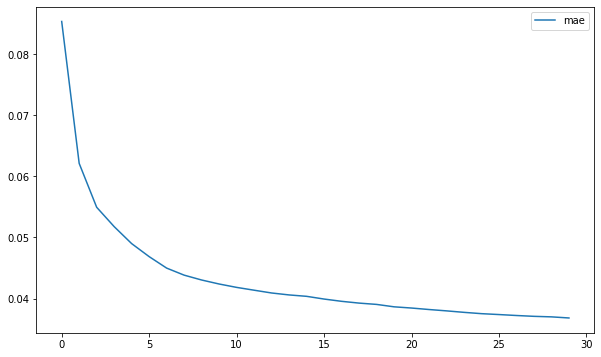

In [28]:

# plot MAE and loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['mae'], label='mae')
#plt.plot(history.history['loss'], label='loss')
plt.legend()
plt.show() 

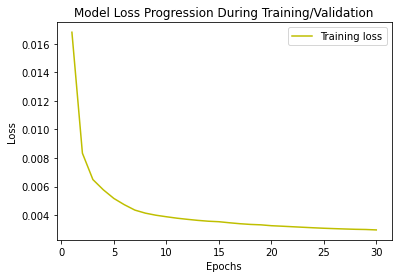

In [29]:
loss= history.history['loss']

epochs=range(1,len(loss)+1)
plt.plot(epochs, loss, 'y', label='Training loss')

plt.title('Model Loss Progression During Training/Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

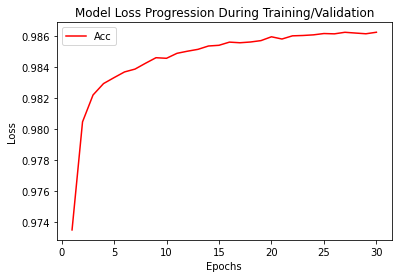

In [30]:

accuracy=history.history['accuracy']
epochs=range(1,len(loss)+1)
plt.plot(epochs,accuracy, 'r', label='Acc')
plt.title('Model Loss Progression During Training/Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

In [31]:
validation_x[0].shape

(10, 8)

In [32]:
validation_x.shape
test_data = np.reshape(validation_x[0],(1, validation_x[0].shape[0], validation_x[0].shape[1]))

In [33]:
v = X_test[11:]
v.shape

(219266, 8)

In [34]:
test = model.predict(test_data)
test

1/1 [==============================] - 0s 29ms/step


array([[-0.10942482, -0.99057925]], dtype=float32)

In [35]:
trainPredict.shape

(657819, 2)

In [36]:
from sklearn.metrics import mean_squared_error

trainScore = np.sqrt(mean_squared_error(train_y, trainPredict))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(validation_y, testPredict))
print('Test Score: %.2f RMSE' % (testScore))

Train Score: 0.05 RMSE
Test Score: 0.06 RMSE


In [37]:
#pred = np.zeros((len(testPredict),1))

#for iter in range(len(testPredict)):
#  x = testPredict[iter][0]
#  y = testPredict[iter][1]
#  pred[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))


x_test = scaler.inverse_transform(v)

pred = np.zeros((len(testPredict),1))

for iter in range(len(testPredict)):
  x = testPredict[iter][0]
  y = testPredict[iter][1]
  pred[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))

  
  if ((pred[iter] >= 80) & (x_test[iter][-1] <= 20)) : 
    pred[iter] = pred[iter] - 100  
    if abs(pred[iter]) >= 5:
      pred[iter] = 0 
  

  if ((pred[iter] <= 20) & (x_test[iter][-1] >= 150)):
    pred[iter] = 100 - pred[iter]
    if abs(pred[iter]) >= 5:
        pred[iter] = 100

  

  

  #if (pred[iter] > 100):
  #  pred[iter] = pred[iter] - 100

pred1=pd.DataFrame(pred).sort_index().reset_index()

In [38]:
#pred = np.zeros((len(testPredict),1))

#for iter in range(len(testPredict)):
#  x = testPredict[iter][0]
#  y = testPredict[iter][1]
#  pred[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))


In [39]:
actual = np.zeros((len(validation_y),1))

for iter in range(len(validation_y)):
  x =validation_y[iter][0]
  y =validation_y[iter][1]
  actual[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))

In [40]:
correct = 0
for i in range(5):
  correct = 0
  for iter in range(len(actual)):
    if (abs(actual[iter] - pred[iter]) <= (i+1)):
      correct+=1

  print(correct)
  print(len(actual))

  print("Precision ", i+1, ": ", correct * 100/len(actual))

132709
219266
Precision  1 :  60.524203478879535
195285
219266
Precision  2 :  89.0630558317295
212925
219266
Precision  3 :  97.10807877190263
217672
219266
Precision  4 :  99.27302910619977
218864
219266
Precision  5 :  99.8166610418396


In [41]:
# linspace
#rv = multivariate_normal ([0,0],[1,.5],[.5,1])
# Z = rv,pdf(pos)
# contour(x,y,z)

In [42]:
perc_rmse = np.sqrt(mean_squared_error(actual, pred))
print("Predicting Percentage RMSE: ", perc_rmse)

Predicting Percentage RMSE:  1.3047901030532056


In [43]:
rmse = 0
length = len(actual)
for i in range(len(actual)):
  if abs (pred[i] - actual[i]) >= 90:
    length -= 1
  else:
    rmse = rmse + pow(pred[i] - actual[i], 2)
rmse = rmse / length
rmse = math.sqrt(rmse)
print(length)
print(len(actual))
print(rmse)

219265
219266
1.2875971514203643


Text(0, 0.5, 'Percentage (%)')

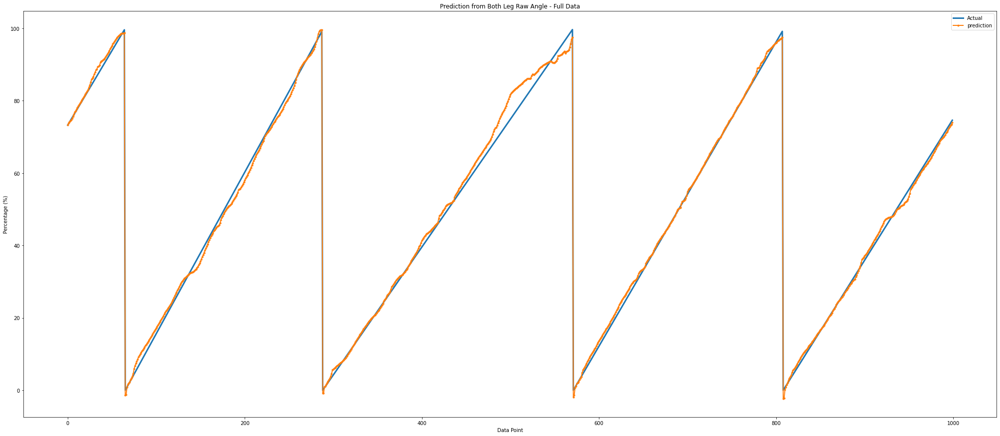

In [44]:
#plt.plot(Y[52272:52470],LShank[52272:52470],'--',label='Actual')
#plt.plot(pred,LShank,'--',label='prediction')
fig=plt.figure(figsize=(35,15))

plt.plot(actual[0:1000],'-',label='Actual', linewidth = 3)
plt.plot(pred[0:1000],'.-',label='prediction', linewidth = 2)



#plt.plot(actual[350:556],Rfoot[350:556],'.',label='Actual')
#plt.plot(pred[350:556],Rfoot[350:556],'.',label='prediction')

plt.legend()
plt.title('Prediction from Both Leg Raw Angle - Full Data')
#plt.title('Right Foot')
#plt.ylabel('Angle')
#plt.xlabel('Gait Cycle Percentage')
plt.xlabel('Data Point')
plt.ylabel('Percentage (%)')

Text(0.5, 1.0, 'Actual vs Prediction')

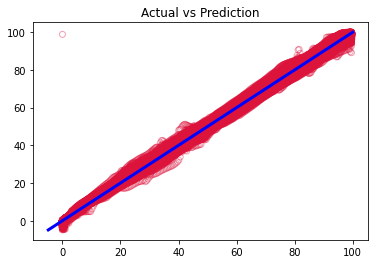

In [45]:
plt.scatter(actual, pred, facecolors='none', edgecolors='crimson',alpha=0.4)
p1 = max(max(pred), max(actual))
p2 = min(min(pred), min(actual))

ci = 0.1 * np.std([p1,p2]) / np.mean([p1,p2])

plt.plot([p1, p2], [p1, p2], 'b-', linewidth =3)
plt.title('Actual vs Prediction')

In [46]:
#predict = np.zeros((len(test_new),1))

#for iter in range(len(test_new)):
#  x = test_new[iter][0]
#  y = test_new[iter][1]
#  predict[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))


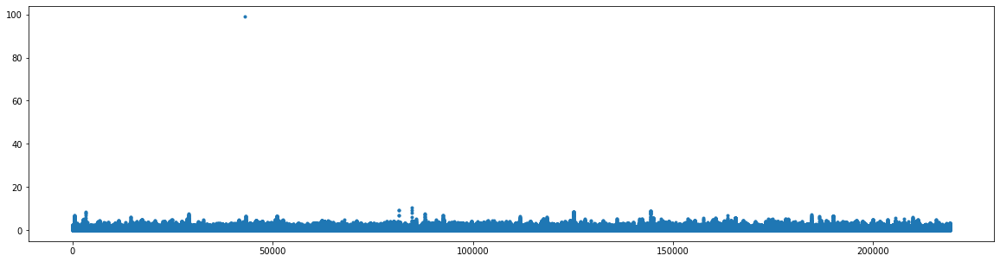

In [47]:
predfig=plt.figure(figsize=(20,5))
dif = abs(actual-pred)

plt.plot(dif,'.')


In [48]:
data_dif = pd.DataFrame(pred)
print(data_dif.to_string())

                 0
0        73.248987
1        73.883854
2        74.077108
3        74.440473
4        74.656530
5        75.062170
6        75.651382
7        76.211702
8        76.829008
9        77.204665
10       77.645354
11       78.082760
12       78.522093
13       78.924031
14       79.330236
15       79.737989
16       80.145196
17       80.551059
18       80.957992
19       81.369867
20       81.787694
21       82.208339
22       82.626543
23       83.045310
24       83.723279
25       84.244017
26       85.103381
27       85.895908
28       86.287740
29       86.688679
30       87.267629
31       87.888033
32       88.510730
33       88.774970
34       89.388043
35       89.518703
36       89.781317
37       90.619120
38       90.943148
39       91.052133
40       91.260782
41       91.508535
42       91.781776
43       92.125740
44       92.525930
45       92.912609
46       93.338812
47       93.799781
48       94.282496
49       94.764855
50       95.225957
51       95.

In [49]:
act_dif = pd.DataFrame(actual)
print(act_dif.to_string())

                0
0       73.251029
1       73.662551
2       74.074074
3       74.485597
4       74.897119
5       75.308642
6       75.720165
7       76.131687
8       76.543210
9       76.954733
10      77.366255
11      77.777778
12      78.189300
13      78.600823
14      79.012346
15      79.423868
16      79.835391
17      80.246914
18      80.658436
19      81.069959
20      81.481481
21      81.893004
22      82.304527
23      82.716049
24      83.127572
25      83.539095
26      83.950617
27      84.362140
28      84.773663
29      85.185185
30      85.596708
31      86.008230
32      86.419753
33      86.831276
34      87.242798
35      87.654321
36      88.065844
37      88.477366
38      88.888889
39      89.300412
40      89.711934
41      90.123457
42      90.534979
43      90.946502
44      91.358025
45      91.769547
46      92.181070
47      92.592593
48      93.004115
49      93.415638
50      93.827160
51      94.238683
52      94.650206
53      95.061728
54      95

In [50]:
for i in range(len(pred)):
    if (abs(actual[i]-pred[i]) > 50):
        print(i)

42968


In [51]:
strike = pd.DataFrame(x_test[:,-1])
print(strike.to_string())

            0
0       179.0
1       180.0
2       181.0
3       182.0
4       183.0
5       184.0
6       185.0
7       186.0
8       187.0
9       188.0
10      189.0
11      190.0
12      191.0
13      192.0
14      193.0
15      194.0
16      195.0
17      196.0
18      197.0
19      198.0
20      199.0
21      200.0
22      201.0
23      202.0
24      203.0
25      204.0
26      205.0
27      206.0
28      207.0
29      208.0
30      209.0
31      210.0
32      211.0
33      212.0
34      213.0
35      214.0
36      215.0
37      216.0
38      217.0
39      218.0
40      219.0
41      220.0
42      221.0
43      222.0
44      223.0
45      224.0
46      225.0
47      226.0
48      227.0
49      228.0
50      229.0
51      230.0
52      231.0
53      232.0
54      233.0
55      234.0
56      235.0
57      236.0
58      237.0
59      238.0
60      239.0
61      240.0
62      241.0
63      242.0
64      243.0
65        1.0
66        2.0
67        3.0
68        4.0
69        5.0
70    

In [52]:
x_test[18604][:]

array([  0.        ,   0.        , 239.37738398, 303.8165055 ,
       326.99401339, 298.12745185,   0.        , 110.        ])

In [53]:
print('Predict: ', pred[18604])
print('Actual: ', actual[18604])

Predict:  [49.5463653]
Actual:  [47.18614719]


In [54]:
dif[18604]

array([2.36021812])

**TEST ON OTHER SUBJECT**

In [55]:
test_file_list = []

for i in range(len(test_sub)):
    test_file_list.append(pd.read_excel(excel_path + test_sub[i], sheet_name='Sheet1'))

In [56]:
## if there are multiple subject to test:
# random.shuffle(test_file_list)

all_test = pd.concat(test_file_list, axis = 0, ignore_index = True)

In [57]:
all_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 217324 entries, 0 to 217323
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   l_ph_hip      217324 non-null  float64
 1   l_ph_ank      217324 non-null  float64
 2   l_ph_fo       217324 non-null  float64
 3   r_ph_hip      217324 non-null  float64
 4   r_ph_ank      217324 non-null  float64
 5   r_ph_fo       217324 non-null  float64
 6   n_lgrf        217324 non-null  float64
 7   n_r_grf       217324 non-null  float64
 8   n_lcop        217324 non-null  float64
 9   n_rcop        217324 non-null  float64
 10  perc_new      217324 non-null  float64
 11  st_sw_phase   217324 non-null  int64  
 12  strike_frame  217324 non-null  int64  
dtypes: float64(11), int64(2)
memory usage: 21.6 MB


In [58]:
cycle = 0
cycle_list = []

start = 0

for i in range(len(all_test) - 1):
    if (all_test['perc_new'][i+1] == 0):
        cycle += 1
        cycle_list.append(all_test.iloc[start:i])
        start = i+1

random.shuffle(cycle_list)
test_table = pd.concat(cycle_list, axis=0, ignore_index=True)

test_table

,l_ph_hip,l_ph_ank,l_ph_fo,r_ph_hip,r_ph_ank,r_ph_fo,n_lgrf,n_r_grf,n_lcop,n_rcop,perc_new,st_sw_phase,strike_frame
0,0.551562,0.738732,0.831215,0.863667,0.864878,0.742233,0.849648,0.050898,0.118481,0.001668,0.000000,0,1
1,0.504309,0.739199,0.816203,0.860715,0.850084,0.740455,0.848639,0.069574,0.119755,0.002263,0.421941,0,2
2,0.455756,0.739424,0.804836,0.858316,0.838800,0.738619,0.845733,0.090504,0.120945,0.002942,0.843882,0,3
3,0.413514,0.739466,0.795988,0.856429,0.830050,0.736706,0.840931,0.113181,0.122029,0.003708,1.265823,0,4
4,0.380640,0.739363,0.788921,0.855012,0.823165,0.734691,0.834261,0.137096,0.122987,0.004562,1.687764,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
216102,0.635701,0.657920,0.223068,0.905064,0.134765,0.717969,0.697644,0.000000,0.085416,0.000037,97.446809,0,230
216103,0.627057,0.668937,0.220424,0.900078,0.102878,0.718988,0.696468,0.000000,0.086560,0.000135,97.872340,0,231
216104,0.616774,0.678313,0.217341,0.895415,0.060093,0.719572,0.694718,0.000000,0.087762,0.000252,98.297872,0,232
216105,0.604349,0.686235,0.213673,0.891065,0.008712,0.719788,0.692411,0.014802,0.089015,0.000393,98.723404,0,233


In [59]:
test_table = test_table.drop(drop_list, axis = 1)
test_table

,l_ph_hip,l_ph_fo,r_ph_hip,r_ph_fo,n_lcop,n_rcop,perc_new,st_sw_phase,strike_frame
0,0.551562,0.831215,0.863667,0.742233,0.118481,0.001668,0.000000,0,1
1,0.504309,0.816203,0.860715,0.740455,0.119755,0.002263,0.421941,0,2
2,0.455756,0.804836,0.858316,0.738619,0.120945,0.002942,0.843882,0,3
3,0.413514,0.795988,0.856429,0.736706,0.122029,0.003708,1.265823,0,4
4,0.380640,0.788921,0.855012,0.734691,0.122987,0.004562,1.687764,0,5
...,...,...,...,...,...,...,...,...,...
216102,0.635701,0.223068,0.905064,0.717969,0.085416,0.000037,97.446809,0,230
216103,0.627057,0.220424,0.900078,0.718988,0.086560,0.000135,97.872340,0,231
216104,0.616774,0.217341,0.895415,0.719572,0.087762,0.000252,98.297872,0,232
216105,0.604349,0.213673,0.891065,0.719788,0.089015,0.000393,98.723404,0,233


In [60]:
x_test = test_table
x_test = x_test.drop(['perc_new'], axis=1)
scaler2 = MinMaxScaler()
x_test_scaled = scaler2.fit_transform(x_test)
x_test_scaled = pd.DataFrame(x_test_scaled)

encode_gait_percentage(test_table, 'perc_new')
y_test = test_table[["X","Y"]]
y_test

data_x_test = x_test_scaled


In [61]:
#data_y_test = y_test.values.reshape(-1, 2)
data_y_test = y_test.values

In [62]:
test_x, test_y = convert_data(data_x_test, data_y_test, look_back, fore_cast)

In [63]:
check_point = data_x_test[11:]
check_point.shape

(216096, 8)

In [64]:
crossPredict = model.predict(test_x)

6753/6753 [==============================] - 33s 5ms/step


In [65]:
score = np.sqrt(mean_squared_error(test_y, crossPredict))
print('Test Score: %.3f RMSE' % (score))

Test Score: 0.880 RMSE


In [66]:

check_point_test = scaler2.inverse_transform(check_point)

predict = np.zeros((len(crossPredict),1))

for iter in range(len(crossPredict)):
  x = crossPredict[iter][0]
  y = crossPredict[iter][1]
  predict[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))


  if ((predict[iter] >= 80) & (check_point_test[iter][-1] <= 20)) :
    predict[iter] = predict[iter] - 100
    
    #if abs(predict[iter]) >= 5:
    #    predict[iter] = 0


  if ((predict[iter] <= 20) & (check_point_test[iter][-1] >= 150)):
     predict[iter] = 100 - predict[iter]
     #if abs(predict[iter]) >= 5:
     #    predict[iter] = 100

In [67]:
actual2 = np.zeros((len(test_y),1))

for iter in range(len(test_y)):
  x = test_y[iter][0]
  y = test_y[iter][1]
  actual2[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))

In [68]:
correct = 0
for i in range(5):
  correct = 0
  for iter in range(len(actual2)):
    #if (abs(actual[iter] - pred[iter]) <= (i+1)) or (actual[iter]>98) or(actual[iter]<3):
      #correct+=1
      if (abs(actual2[iter] - predict[iter]) <= (i+1)):
        correct+=1

  print(correct)
  print(len(actual2))

  print("Precision ", i+1, ": ", correct * 100/len(actual2))

6644
216096
Precision  1 :  3.074559455057012
13432
216096
Precision  2 :  6.215755960313935
21385
216096
Precision  3 :  9.89606471197986
28927
216096
Precision  4 :  13.386180216200207
36543
216096
Precision  5 :  16.91053976010662


In [69]:
perc_rmse_cross = np.sqrt(mean_squared_error(actual2, predict))
print("Predicting Percentage RMSE: ", perc_rmse_cross)

Predicting Percentage RMSE:  31.464509898007687


In [70]:
rmse = 0
length = len(actual2)
for i in range(len(actual2)):

    rmse = rmse + pow(predict[i] - actual2[i], 2)
rmse = rmse / length
rmse = math.sqrt(rmse)
print(length)
print(len(actual2))
print(rmse)

216096
216096
31.46450989800762


Text(0.5, 1.0, 'Actual vs Prediction')

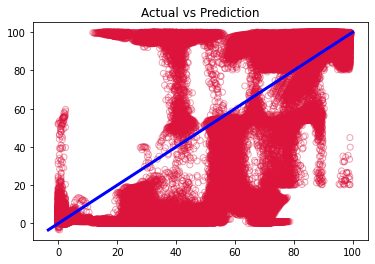

In [71]:
plt.scatter(actual2, predict, facecolors='none', edgecolors='crimson',alpha=0.4)
p1 = max(max(predict), max(actual2))
p2 = min(min(predict), min(actual2))

ci = 0.1 * np.std([p1,p2]) / np.mean([p1,p2])

plt.plot([p1, p2], [p1, p2], 'b-', linewidth =3)
plt.title('Actual vs Prediction')

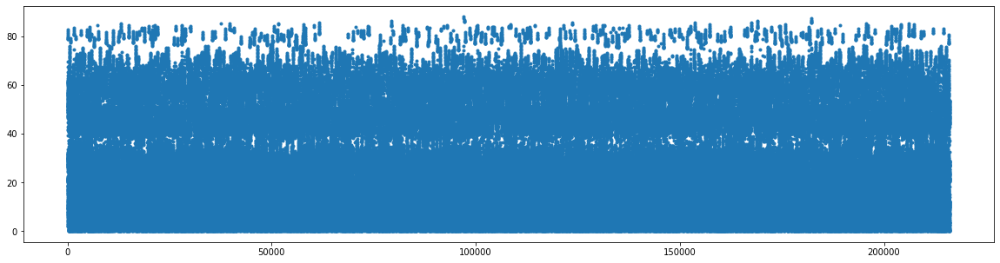

In [72]:
predfig=plt.figure(figsize=(20,5))
dif = abs(actual2-predict)

plt.plot(dif,'.')